In [1]:
!pip install lightning einops

  Using cached einops-0.8.0-py3-none-any.whl.metadata (12 kB)
  Using cached torch-2.2.2-cp39-none-macosx_10_9_x86_64.whl.metadata (25 kB)
  Using cached networkx-3.2.1-py3-none-any.whl.metadata (5.2 kB)
  Using cached mpmath-1.3.0-py3-none-any.whl.metadata (8.6 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 7.9 MB/s eta 0:00:00
Using cached einops-0.8.0-py3-none-any.whl (43 kB)
Using cached torch-2.2.2-cp39-none-macosx_10_9_x86_64.whl (150.8 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 927.3/927.3 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 819.3/819.3 kB 7.9 MB/s eta 0:00:00
Using cached networkx-3.2.1-py3-none-any.whl (1.6 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.2/6.2 MB 10.0 MB/s eta 0:00:00a 0:00:01
Using cached mpmath-1.3.0-py3-none-any.whl (536 kB)

[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: pip install --upgrade pip


In [2]:
# cuda available?
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)


A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.0.1 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "/Users/sebastianwefers/Developer/Tools/conda/base/envs/ViT/lib/python3.9/runpy.py", line 197, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "/Users/sebastianwefers/Developer/Tools/conda/base/envs/ViT/lib/python3.9/runpy.py", line 87, in _run_code
    exec(code, run_globals)
  File "/Users/sebastianwefers/Developer/Tools/conda/base/envs/ViT/lib/python3.9/site-packages/ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "/Users/sebastianwefers/Developer/Too

cpu


In [3]:
import torch
import numpy as np
import random

def set_seed(seed=14473):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  # For multi-GPU, but also useful to be consistent on single GPU
    
    # Ensure deterministic behavior in PyTorch
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    print(f"Seed set to {seed} for reproducibility.")

# Example: set a seed
set_seed(14473)


Seed set to 14473 for reproducibility.


In [4]:
def worker_init_fn(worker_id):
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)

## ***Helpers***
---

In [5]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
import torch

def calculate_metrics(y_true, y_pred):
    return {
        'accuracy': accuracy_score(y_true, y_pred),
        'f1_micro': f1_score(y_true, y_pred, average='micro'),
        'f1_macro': f1_score(y_true, y_pred, average='macro'),
        'precision_micro': precision_score(y_true, y_pred, average='micro'),
        'precision_macro': precision_score(y_true, y_pred, average='macro'),
        'recall_micro': recall_score(y_true, y_pred, average='micro'),
        'recall_macro': recall_score(y_true, y_pred, average='macro')
    }

import torch

def evaluate_model(model, data_module, device, threshold=0.5, split='test'):
    model.to(device)  # Ensure model is on the correct device
    model.eval()  # Set the model to evaluation mode
    all_preds = []
    all_labels = []

    # Use the appropriate dataloader from the data module
    dataloader = data_module.test_dataloader() if split == 'test' \
                 else data_module.val_dataloader() if split == 'val' \
                 else data_module.train_dataloader()

    with torch.no_grad():  # Disable gradient calculation for evaluation
        for batch in dataloader:
            inputs, labels = batch
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            preds = (torch.sigmoid(outputs) > threshold).long()  # Apply sigmoid and threshold

            all_preds.append(preds.cpu())
            all_labels.append(labels.cpu())

    all_preds = torch.cat(all_preds).numpy()
    all_labels = torch.cat(all_labels).numpy()

    return calculate_metrics(all_labels, all_preds)



import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')

def plot_metrics_curves(model):
    train_epochs = range(len(model.train_losses))
    val_epochs = range(len(model.val_losses))
    
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))  # 1 row, 4 columns

    # Common plot properties
    line_width = 4
    train_color = "#007BFF"
    val_color = "#FF4500"
    tick_label_size = 16
    legend_properties = {
        'facecolor': 'white',
        'edgecolor': 'black',
        'shadow': True,
        'loc': 'upper right',
        'fontsize': 18
    }

    # Calculate final deltas for each metric
    delta_loss = model.train_losses[-1] - model.val_losses[-1]
    delta_f1 = model.train_f1_scores[-1] - model.val_f1_scores[-1]
    delta_precision = model.train_precisions[-1] - model.val_precisions[-1]
    delta_recall = model.train_recalls[-1] - model.val_recalls[-1]

    # Plotting the loss curves
    axs[0].plot(train_epochs, model.train_losses, label='Training', color=train_color, linewidth=line_width)
    axs[0].plot(val_epochs, model.val_losses, label='Validation', color=val_color, linewidth=line_width)
    axs[0].set_title(f'Loss\nΔ={delta_loss:.2f}', fontsize=25, weight='bold', pad=15)

    axs[0].set_xlabel('Epochs', fontsize=20, weight='bold')
    axs[0].set_ylabel('Metric Value', fontsize=20, weight='bold')
    axs[0].tick_params(axis='both', which='major', labelsize=tick_label_size)
    axs[0].legend(**legend_properties)

    # Plotting the F1 score curves
    axs[1].plot(train_epochs, model.train_f1_scores, label='Training', color=train_color, linewidth=line_width)
    axs[1].plot(val_epochs, model.val_f1_scores, label='Validation', color=val_color, linewidth=line_width)
    axs[1].set_title(f'F1 Score\nΔ={delta_f1:.2f}', fontsize=25, weight='bold', pad=15)
    axs[1].set_xlabel('Epochs', fontsize=20, weight='bold')
    axs[1].set_ylim(0, 1)
    axs[1].tick_params(axis='both', which='major', labelsize=tick_label_size)

    # Plotting the Precision curves
    axs[2].plot(train_epochs, model.train_precisions, label='Training', color=train_color, linewidth=line_width)
    axs[2].plot(val_epochs, model.val_precisions, label='Validation', color=val_color, linewidth=line_width)
    axs[2].set_title(f'Precision\nΔ={delta_precision:.2f}', fontsize=25, weight='bold', pad=15)
    axs[2].set_xlabel('Epochs', fontsize=20, weight='bold')
    axs[2].set_ylim(0, 1)
    axs[2].tick_params(axis='both', which='major', labelsize=tick_label_size)

    # Plotting the Recall curves
    axs[3].plot(train_epochs, model.train_recalls, label='Training', color=train_color, linewidth=line_width)
    axs[3].plot(val_epochs, model.val_recalls, label='Validation', color=val_color, linewidth=line_width)
    axs[3].set_title(f'Recall\nΔ={delta_recall:.2f}', fontsize=25, weight='bold', pad=15)
    axs[3].set_xlabel('Epochs', fontsize=20, weight='bold')
    axs[3].set_ylim(0, 1)
    axs[3].tick_params(axis='both', which='major', labelsize=tick_label_size)

    plt.tight_layout()
    plt.show();




from PIL import Image
import torchvision.transforms as transforms
import torch

def preprocess_single_image(image_path, img_size=300, padding_mode='reflect'):
    """
    Load and preprocess a single image using the same transformation as in CoralDataModule.

    Parameters:
    - image_path: Path to the input image.
    - img_size: Target image size (default: 300x300).
    - padding_mode: Padding mode to be used ('reflect' or 'edge').

    Returns:
    - A preprocessed image tensor ready for input into the model.
    """
    def custom_pad(img):
        left = top = right = bottom = 0
        if img.width < img_size or img.height < img_size:
            delta_w = max(img_size - img.width, 0)
            delta_h = max(img_size - img.height, 0)
            left = delta_w // 2
            right = delta_w - left
            top = delta_h // 2
            bottom = delta_h - top
        return transforms.functional.pad(img, (left, top, right, bottom), padding_mode=padding_mode)
    
    # Create the transform pipeline
    transform = transforms.Compose([
        transforms.Lambda(custom_pad),
        transforms.Resize((img_size, img_size)),  # Ensure the image is resized to the target size
        transforms.ToTensor(),  # Convert image to tensor
    ])
    
    # Load the image
    image = Image.open(image_path).convert("RGB")  # Ensure the image is in RGB format

    # Apply the transformations
    image_tensor = transform(image)
    
    return image_tensor    
    
import matplotlib.pyplot as plt
import torch

def plot_original_images(input_images):
    """
    Plot the original images in a single row.

    Parameters:
    - input_images: A list of input image tensors (C, H, W).

    Returns:
    - None (displays the plot)
    """
    num_images = len(input_images)
    fig, axes = plt.subplots(1, num_images, figsize=(7 * num_images, 7))  # Create a row of subplots

    for idx, input_image in enumerate(input_images):
        # Convert the image tensor to a format suitable for plotting
        original_img = input_image.permute(1, 2, 0).cpu().numpy()
        axes[idx].imshow(original_img)
        axes[idx].axis('off')
        axes[idx].set_title(
            f"#{idx + 1}", 
            fontsize=30, weight='bold'
        )

    plt.tight_layout()
    plt.show()

import matplotlib.pyplot as plt
import torch
import numpy as np
from mpl_toolkits.axes_grid1 import make_axes_locatable
import cv2

def visualize_average_attention_maps(model, input_images):
    """
    Visualize the average attention maps from the Vision Transformer overlaid on the original images in a single row
    with a single colorbar at the end.

    Parameters:
    - model: The trained Vision Transformer model.
    - input_images: A list of four input image tensors (C, H, W).

    Returns:
    - None (displays the plot)
    """
    model.eval()
    fig, axes = plt.subplots(1, 4, figsize=(28, 7))  # Create a row of 4 subplots

    for idx, input_image in enumerate(input_images):
        patch_size = model.patch_embedding.patch_size  # Dynamically get the patch size from the model
        img_size = input_image.shape[1]  # Assuming input_image is (C, H, W) and H == W

        with torch.no_grad():
            prediction, attn_maps = model(input_image.unsqueeze(0), return_attn=True)

        predicted_prob = torch.sigmoid(prediction).item()
        predicted_label = 'Healthy' if predicted_prob >= 0.5 else 'Bleached'

        # Use the last layer's attention map
        last_layer_attn = attn_maps[-1].squeeze(0)  # Assume batch size of 1 for simplicity

        # Calculate average attention map across all heads
        avg_attn_map = last_layer_attn.mean(0).cpu().numpy()

        # Reshape the attention map to match the number of patches
        num_patches = img_size // patch_size
        reshaped_attn_map = avg_attn_map[1:].reshape(num_patches, num_patches)  # Exclude the CLS token

        # Resize the attention map to match the image size using interpolation
        resized_attn_map = cv2.resize(reshaped_attn_map, (img_size, img_size), interpolation=cv2.INTER_LINEAR)

        # Normalize the resized attention map for better visualization
        resized_attn_map = (resized_attn_map - resized_attn_map.min()) / (resized_attn_map.max() - resized_attn_map.min())

        # Plot the original image and the attention map overlay
        original_img = input_image.permute(1, 2, 0).cpu().numpy()
        im = axes[idx].imshow(original_img)
        overlay = axes[idx].imshow(resized_attn_map, cmap='coolwarm', alpha=0.66)  # Adjust alpha to taste
        axes[idx].set_title(f"Pred: {predicted_label} (P: {predicted_prob:.2f})", fontsize=30, weight='bold')
        axes[idx].axis('off')

        # Only create the colorbar on the last subplot
        if idx == 3:
            divider = make_axes_locatable(axes[idx])
            cax = divider.append_axes("right", size="5%", pad=0.1)
            cbar = plt.colorbar(overlay, cax=cax)
            cbar.ax.tick_params(labelsize=25)  # Set the size of the tick labels

    plt.tight_layout()
    plt.show();
    

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def visualize_model_predictions(model, data_module):
    """
    Visualizes the prediction results of a pre-trained model by plotting the probability distributions
    for different quadrants of the confusion matrix using the test data provided by the data module.
    
    Parameters:
    - model: A pre-trained PyTorch model.
    - data_module: A PyTorch Lightning data module with a defined test dataloader.
    """
    # Ensure the model is in evaluation mode
    model.eval()
    test_loader = data_module.test_dataloader()
    predictions, labels = [], []

    # Collect predictions and labels from the test dataset
    with torch.no_grad():
        for batch in test_loader:
            inputs, y = batch
            inputs = inputs.to(model.device)
            logits = model(inputs)
            y_prob = torch.sigmoid(logits).cpu().numpy()  # Apply sigmoid if the model outputs logits
            predictions.extend(y_prob)
            labels.extend(y.cpu().numpy())

    # Create a DataFrame for the predictions and actual labels
    df_predictions = pd.DataFrame({
        'y': labels,
        'y_proba': np.array(predictions).flatten()
    })

    # Setup plot dimensions and style
    fig, axs = plt.subplots(ncols=2, nrows=2, sharex=True, sharey=True, figsize=(8, 7))
    bins = np.linspace(0, 1, 21)

    # Helper function to plot each quadrant of the confusion matrix
    def show_quarter(df, query, col, title, ax, bins, color, alpha, x_label=None, y_label=None):
        results = df.query(query)
        sns.histplot(results[col], kde=False, ax=ax, bins=bins, color=color, alpha=alpha)
        if y_label:
            ax.set_ylabel(y_label, fontsize=18.5)
        if x_label:
            ax.set_xlabel(x_label, fontsize=18.5)
        ax.set_title(f'{title} ({results.shape[0]})', fontsize=18.5, weight='bold')
        ax.axvline(x=0.5, color='red', linestyle='-.', linewidth=2)

        # Increase tick label font size
        ax.tick_params(axis='both', which='major', labelsize=15)

    # Visualize probabilities for each quadrant
    blue = "#007BFF"
    red = "#FF4500"
    show_quarter(df_predictions, "y==0 and y_proba < 0.5", "y_proba", "True Negatives", axs[0, 0], bins, blue, 0.6, y_label="False")
    show_quarter(df_predictions, "y==0 and y_proba >= 0.5", "y_proba", "False Positives", axs[0, 1], bins, red, 0.6)
    show_quarter(df_predictions, "y==1 and y_proba >= 0.5", "y_proba", "True Positives", axs[1, 1], bins, red, 0.6, x_label="Probability")
    show_quarter(df_predictions, "y==1 and y_proba < 0.5", "y_proba", "False Negatives", axs[1, 0], bins, blue, 0.6, x_label="Probability", y_label="True")

    # Configure common labels and title for the figure
    fig.text(0.5, 0.003, 'Predicted', ha='center', va='center', fontsize=18.5, weight='bold')
    fig.text(0.003, 0.5, 'True Label', ha='center', va='center', rotation='vertical', fontsize=18.5, weight='bold')
    #fig.suptitle("Model Predictions: Probabilities per Confusion Matrix Quadrant", fontsize=18)

    plt.tight_layout()
    plt.show()

ModuleNotFoundError: No module named 'seaborn'

## ***1) EDA***
---

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


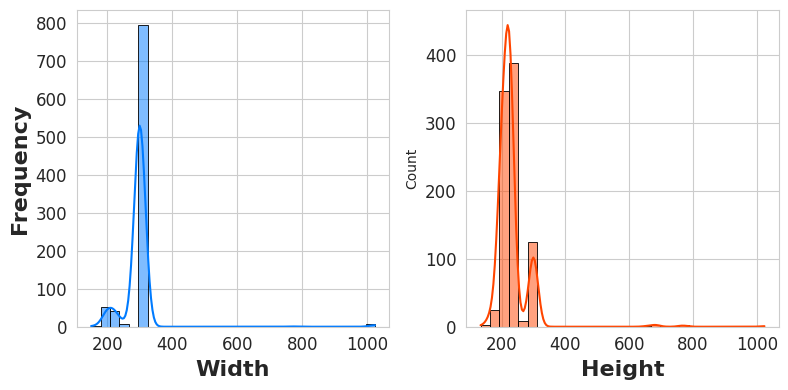

In [5]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid")

def collect_image_dimensions(root_dir):
    widths = []
    heights = []

    # Walk through all files in the directory
    for root, dirs, files in os.walk(root_dir):
        for file in files:
            if file.lower().endswith(('png', 'jpg', 'jpeg', 'bmp', 'gif', 'tif', 'tiff')):
                try:
                    image_path = os.path.join(root, file)
                    with Image.open(image_path) as img:
                        width, height = img.size
                        widths.append(width)
                        heights.append(height)

                except Exception as e:
                    print(f"Failed to open or process image {image_path}. Error: {str(e)}")

    return widths, heights

blue = "#007BFF"
red = "#FF4500"

def plot_distributions(widths, heights):
    plt.figure(figsize=(8, 4))

    plt.subplot(1, 2, 1)
    sns.histplot(widths, bins=30, kde=True, color=blue, edgecolor='black')
    plt.title('', fontsize=30)
    plt.xlabel('Width', fontsize=16, weight='bold')
    plt.ylabel('Frequency', fontsize=16, weight='bold')
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)

    plt.subplot(1, 2, 2)
    sns.histplot(heights, bins=30, kde=True, color=red, edgecolor='black')
    plt.title('', fontsize=30)
    plt.xlabel('Height',fontsize=16, weight='bold')
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)

    plt.tight_layout()
    plt.show()

# Directory containing the images
image_directory = 'coral_original'  # Adjust this path if needed
widths, heights = collect_image_dimensions(image_directory)
plot_distributions(widths, heights)


In [71]:
import os
from PIL import Image

def image_statistics_summary(root_dir, threshold_below=400, width_threshold=300, height_threshold=300):
    min_width = float('inf')
    min_height = float('inf')
    max_width = 0
    max_height = 0
    max_width_below_threshold = 0
    max_height_below_threshold = 0
    count_above_threshold = 0

    # Walk through all files in the directory
    for root, dirs, files in os.walk(root_dir):
        for file in files:
            if file.lower().endswith(('png', 'jpg', 'jpeg', 'bmp', 'gif', 'tif', 'tiff')):
                try:
                    image_path = os.path.join(root, file)
                    with Image.open(image_path) as img:
                        width, height = img.size

                        # Update min and max dimensions
                        if width < min_width:
                            min_width = width
                        if height < min_height:
                            min_height = height
                        if width > max_width:
                            max_width = width
                        if height > max_height:
                            max_height = height

                        # Update max dimensions below threshold
                        if width < threshold_below and height < threshold_below:
                            if width > max_width_below_threshold:
                                max_width_below_threshold = width
                            if height > max_height_below_threshold:
                                max_height_below_threshold = height

                        # Count images above either dimension threshold
                        if width > width_threshold or height > height_threshold:
                            count_above_threshold += 1

                except Exception as e:
                    print(f"Failed to open or process image {image_path}. Error: {str(e)}")

    # Print the summary statistics
    print(f"Minimum dimensions: {min_width}x{min_height}")
    print(f"Maximum dimensions: {max_width}x{max_height}")
    print(f"Maximum dimensions below {threshold_below}px: {max_width_below_threshold}x{max_height_below_threshold}")
    print(f"Number of images where either dimension is above {width_threshold}px or {height_threshold}px: {count_above_threshold}")

# Directory containing the images
image_directory = 'coral_original'
image_statistics_summary(image_directory)

Minimum dimensions: 150x134
Maximum dimensions: 1024x1024
Maximum dimensions below 400px: 300x300
Number of images where either dimension is above 300px or 300px: 7


## ***2) Create DataModule***
---

Class to index mapping: {'bleached_corals': 0, 'healthy_corals': 1}


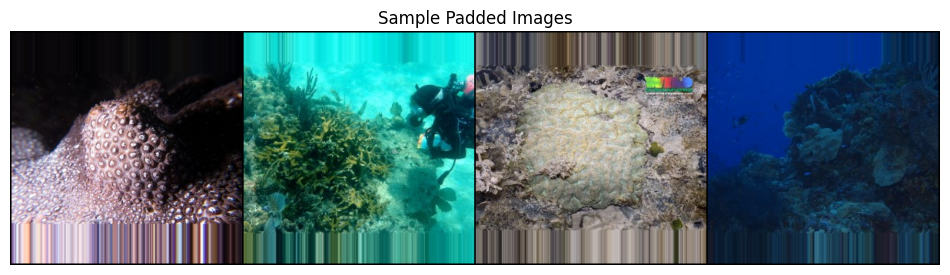

In [2]:
import os
import torch
import pytorch_lightning as pl
from torchvision import datasets, transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader, Subset, random_split
from PIL import Image
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np

class CoralDataModule(pl.LightningDataModule):
    def __init__(
        self, 
        data_dir, 
        batch_size=64, 
        img_size=300, 
        scaler_type='min-max', 
        test_size=0.2, 
        val_size=0.1, 
        num_workers=2,
        padding_mode='reflect' # Padding mode can be 'reflect' or 'edge'
    ):
        super().__init__()
        self.data_dir = data_dir
        self.batch_size = batch_size
        self.img_size = img_size
        self.scaler_type = scaler_type
        self.test_size = test_size
        self.val_size = val_size
        self.num_workers = num_workers
        self.padding_mode = padding_mode
        self.transform = self.get_transform()

        
        
    def custom_pad(self, img):
        left = top = right = bottom = 0
        if img.width < 300 or img.height < 300:
            delta_w = max(300 - img.width, 0)
            delta_h = max(300 - img.height, 0)
            left = delta_w // 2
            right = delta_w - left
            top = delta_h // 2
            bottom = delta_h - top
        return transforms.functional.pad(img, (left, top, right, bottom), padding_mode=self.padding_mode)
    
    def get_transform(self):
        """
        Selects the appropriate scaling transform based on the `scaler_type`.
        """
        base_transforms = [
            transforms.Lambda(self.custom_pad),
            transforms.Resize((self.img_size, self.img_size)),   #!!!! Forced to resize to 300x300 (no-op for padded & 300x300 images)
            transforms.ToTensor()
        ]
        
        # Apply scaling based on `scaler_type`
        if self.scaler_type == 'min-max':
            # Default: ToTensor scales between 0 and 1, no extra scaling needed
            return transforms.Compose(base_transforms)
        elif self.scaler_type == 'pi-scale':
            # Scale data to [-pi, +pi]
            base_transforms.append(transforms.Lambda(lambda x: x * 2 * np.pi - np.pi))
            return transforms.Compose(base_transforms)
        else:
            raise ValueError(f"Unknown scaler_type: {self.scaler_type}")


    def setup(self, stage=None):
        def is_image_file(filename):
            return any(filename.endswith(extension) for extension in ['.jpg', '.jpeg', '.png', '.bmp', '.gif'])

        def filter_large_images(path):
            if not is_image_file(path):
                return False
            with Image.open(path) as img:
                return img.width <= 300 and img.height <= 300

        full_dataset = datasets.ImageFolder(
            root=self.data_dir, transform=self.transform, is_valid_file=filter_large_images
        )
        print("Class to index mapping:", full_dataset.class_to_idx)


        # Splitting the dataset
        train_val_idx, test_idx = train_test_split(
            range(len(full_dataset)),
            test_size=self.test_size,
            shuffle=True,
            stratify=full_dataset.targets,
            random_state=14473
        )

        train_idx, val_idx = train_test_split(
            train_val_idx,
            test_size=self.val_size / (1 - self.test_size),
            shuffle=True,
            stratify=[full_dataset.targets[i] for i in train_val_idx],
            random_state=14473
        )

        self.train_dataset = Subset(full_dataset, train_idx)
        self.val_dataset = Subset(full_dataset, val_idx)
        self.test_dataset = Subset(full_dataset, test_idx)


    def display_sample_images(self):
        sample_loader = DataLoader(self.train_dataset, batch_size=4, shuffle=True)
        data = next(iter(sample_loader))
        images = data[0]
        grid = make_grid(images)
        plt.figure(figsize=(12, 12))
        plt.imshow(grid.permute(1, 2, 0))
        plt.title('Sample Padded Images')
        plt.axis('off')
        plt.show()
    
    def _calculate_rgb_statistics(self, dataset):
        loader = DataLoader(dataset, batch_size=self.batch_size, num_workers=self.num_workers)
        mean = torch.tensor([0.0, 0.0, 0.0])
        std = torch.tensor([0.0, 0.0, 0.0])
        for images, _ in loader:
            for i in range(3):  # RGB channels
                mean[i] += images[:, i, :, :].mean()
                std[i] += images[:, i, :, :].std()

        mean /= len(loader)
        std /= len(loader)
        return mean, std

    def _verify_rgb_distribution(self):
        train_mean, train_std = self._calculate_rgb_statistics(self.train_dataset)
        val_mean, val_std = self._calculate_rgb_statistics(self.val_dataset)
        test_mean, test_std = self._calculate_rgb_statistics(self.test_dataset)
        
        print("RGB Distributions:")
        print(f"   - Train Mean: {train_mean}, Std: {train_std}")
        print(f"   - Val Mean: {val_mean}, Std: {val_std}")
        print(f"   - Test Mean: {test_mean}, Std: {test_std}")

        # Here you could implement checks to see if the differences are too large and potentially adjust your splits
    def _verify_class_distribution(self):
        def get_class_counts(dataset):
            targets = [dataset[i][1] for i in range(len(dataset))]
            class_counts = np.bincount(targets, minlength=len(self.train_dataset.dataset.classes))
            return class_counts
        
        train_counts = get_class_counts(self.train_dataset)
        val_counts = get_class_counts(self.val_dataset)
        test_counts = get_class_counts(self.test_dataset)
        
        print("\nLabel Distributions:")
        print("   - Train set:", train_counts)
        print("   - Val set:", val_counts)
        print("   - Test set:", test_counts)

    def train_dataloader(self):
        return DataLoader(
            self.train_dataset, batch_size=self.batch_size, shuffle=True, num_workers=self.num_workers, pin_memory=True, worker_init_fn=worker_init_fn
        )

    def val_dataloader(self):
        return DataLoader(
            self.val_dataset, batch_size=self.batch_size, num_workers=self.num_workers, pin_memory=True, worker_init_fn=worker_init_fn
        )

    def test_dataloader(self):
        return DataLoader(
            self.test_dataset, batch_size=self.batch_size, num_workers=self.num_workers, pin_memory=True, worker_init_fn=worker_init_fn
        )


data_dir = '/Users/sebastianwefers/Desktop/Kolmogorov-Arnold-Fourier-Embeddings/data/coral_original'

# Example usage
data_module = CoralDataModule(
        data_dir=data_dir,
        batch_size=64,
        img_size=300,
        scaler_type='min-max',
        test_size=0.2,                 # originally 0.2
        val_size=0.1,                  # originally 0.1
        num_workers=2,
        padding_mode='edge'            # Padding mode can be 'reflect' or 'edge'
)
data_module.setup()
#data_module._verify_rgb_distribution()
#data_module._verify_class_distribution()
data_module.display_sample_images()

In [1]:
import numpy as np
print(np.__version__)

1.23.4


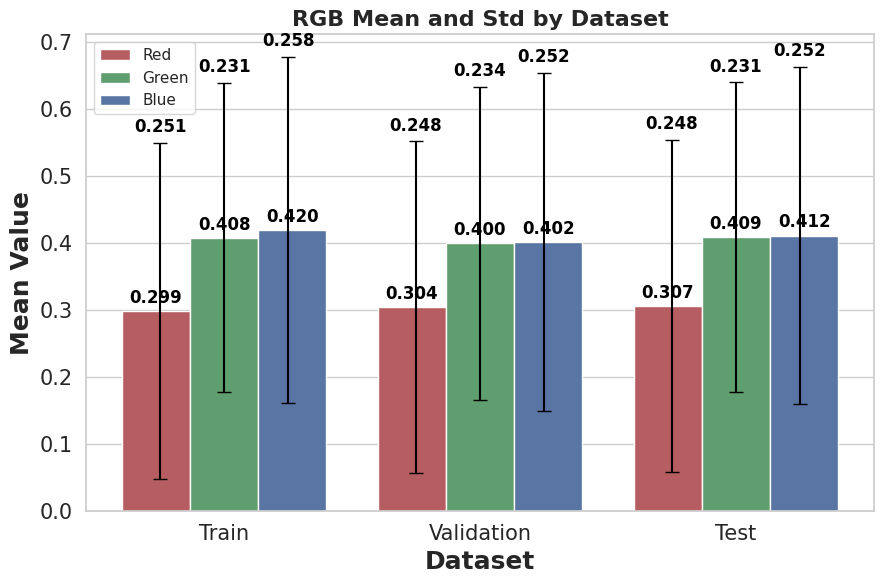

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd


# Data
datasets = ['Train', 'Validation', 'Test']
means = np.array([
    [0.2989, 0.4084, 0.4202],  # Train Mean
    [0.3044, 0.4000, 0.4022],  # Validation Mean
    [0.3066, 0.4095, 0.4116]   # Test Mean
])
stds = np.array([
    [0.2512, 0.2308, 0.2580],  # Train Std
    [0.2480, 0.2336, 0.2524],  # Validation Std
    [0.2479, 0.2309, 0.2515]   # Test Std
])

# Convert to DataFrame for Seaborn
data = {
    'Dataset': np.repeat(datasets, 3),
    'Channel': ['Red', 'Green', 'Blue'] * len(datasets),
    'Mean': means.flatten(),
    'Std': stds.flatten()
}

df = pd.DataFrame(data)

# Plotting with Seaborn
sns.set(style="whitegrid")

plt.figure(figsize=(9, 6))
barplot = sns.barplot(x='Dataset', y='Mean', hue='Channel', data=df, palette=['r', 'g', 'b'], errorbar=None)

# Adding error bars manually
for i in range(len(datasets)):
    for j, color in enumerate(['r', 'g', 'b']):
        plt.errorbar(x=i + (j-1)*0.25, y=means[i, j], yerr=stds[i, j], fmt='none', c='black', capsize=5)
        # Annotating std values on top of the error bars
        plt.annotate(f'{stds[i, j]:.3f}', 
                     (i + (j-1)*0.25, means[i, j] + stds[i, j] + 0.01),  # Adjust position as needed
                     ha='center', va='bottom', fontsize=12, color='black', weight='bold')

# Adding mean value labels on top of the bars
for i, p in enumerate(barplot.patches):
    mean_val = p.get_height()
    barplot.annotate(f'{mean_val:.3f}',
                     (p.get_x() + p.get_width() / 2., mean_val),
                     ha = 'center', va = 'bottom', 
                     xytext = (0, 3),  # Slightly above the bar
                     textcoords = 'offset points',
                     fontsize=12, weight='bold', color='black')

# Customizing ticks
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

# Labels and title
plt.xlabel('Dataset', fontsize=18, weight='bold')
plt.ylabel('Mean Value', fontsize=18, weight='bold')
plt.title('RGB Mean and Std by Dataset', fontsize=16, weight='bold')

plt.legend(title='', fontsize=11, title_fontsize='13', loc='upper left')
plt.tight_layout()
plt.show()


In [ ]:
import torch
print(torch.__version__)

2.2.2


In [7]:
## in case of error - most likely due nto .ipynb_checkpoints:
!find coral_original -mindepth 1 -maxdepth 1 ! -name 'healthy_corals' ! -name 'bleached_corals' -print

## ***`Model Configurations`***
---

In [7]:
# Fourier-based embedding layer
import torch as th
import numpy as np

class NaiveFourierKANLayer(th.nn.Module):
    """ link: https://github.com/GistNoesis/FourierKAN/blob/main/fftKAN.py
    """
    def __init__( self, inputdim, outdim, gridsize, addbias=True, smooth_initialization=False):
        super(NaiveFourierKANLayer,self).__init__()
        self.gridsize = gridsize
        self.addbias  = addbias
        self.inputdim = inputdim
        self.outdim   = outdim

        # With smooth_initialization, fourier coefficients are attenuated by the square of their frequency.
        # This makes KAN's scalar functions smooth at initialization.
        # Without smooth_initialization, high gridsizes will lead to high-frequency scalar functions,
        # with high derivatives and low correlation between similar inputs.
        grid_norm_factor = (th.arange(gridsize) + 1)**2 if smooth_initialization else np.sqrt(gridsize)

        #The normalization has been chosen so that if given inputs where each coordinate is of unit variance,
        #then each coordinates of the output is of unit variance
        #independently of the various sizes
        self.fouriercoeffs = th.nn.Parameter( th.randn(2,outdim,inputdim,gridsize) /
                                                (np.sqrt(inputdim) * grid_norm_factor ) )
        if( self.addbias ):
            self.bias  = th.nn.Parameter( th.zeros(1,outdim))

    #x.shape ( ... , indim )
    #out.shape ( ..., outdim)
    def forward(self,x):
        xshp = x.shape
        outshape = xshp[0:-1]+(self.outdim,)
        x = th.reshape(x,(-1,self.inputdim))
        #Starting at 1 because constant terms are in the bias
        k = th.reshape( th.arange(1,self.gridsize+1,device=x.device),(1,1,1,self.gridsize))
        xrshp = th.reshape(x,(x.shape[0],1,x.shape[1],1) )
        #This should be fused to avoid materializing memory
        c = th.cos( k*xrshp )
        s = th.sin( k*xrshp )
        #We compute the interpolation of the various functions defined by their fourier coefficient for each input coordinates and we sum them
        y =  th.sum( c*self.fouriercoeffs[0:1],(-2,-1))
        y += th.sum( s*self.fouriercoeffs[1:2],(-2,-1))
        if( self.addbias):
            y += self.bias
        #End fuse
        '''
        #You can use einsum instead to reduce memory usage
        #It stills not as good as fully fused but it should help
        #einsum is usually slower though
        c = th.reshape(c,(1,x.shape[0],x.shape[1],self.gridsize))
        s = th.reshape(s,(1,x.shape[0],x.shape[1],self.gridsize))
        y2 = th.einsum( "dbik,djik->bj", th.concat([c,s],axis=0) ,self.fouriercoeffs )
        if( self.addbias):
            y2 += self.bias
        diff = th.sum((y2-y)**2)
        print("diff")
        print(diff) #should be ~0
        '''
        y = th.reshape( y, outshape)
        return y

In [8]:
import torch as th
import torch.nn as nn
import pytorch_lightning as pl
from torchmetrics import (
    Accuracy, Precision, Recall, F1Score
)
from einops.layers.torch import Rearrange
from einops import repeat
from torch.optim import Adam

class PatchEmbedding(nn.Module):
    """
    PatchEmbedding converts an input image into a sequence of patches for transformer models.

    Parameters
    ----------
    img_size : int
        Size of the input image (assumes square images).
    patch_size : int
        Size of each patch (height and width).
    in_channels : int
        Number of input channels (e.g., 3 for RGB).
    embed_size : int
        Dimensionality of the patch embeddings.
    embedding_type : str, optional, default='conv'
        Type of embedding ('conv', 'linear', 'fourier').
    fourier_params : dict, optional
        Parameters for the Fourier embedding if `embedding_type='fourier'`.

    Attributes
    ----------
    proj : nn.Sequential
        Layer for projecting input images to patch embeddings.
    cls_token : nn.Parameter
        Learnable token prepended to the patch sequence.
    positions : nn.Parameter
        Positional embeddings added to the sequence.

    Methods
    -------
    forward(x)
        Transforms `x` into a sequence of patch embeddings with positional encodings.

    Notes
    -----
    - The `Rearrange` operations reshape the input tensor to match the format required for different embedding types.
    - 'conv': [batch_size, embed_size, h, w] -> [batch_size, num_patches, embed_size].
    - 'linear', 'fourier': [batch_size, in_channels, h*p1, w*p2] -> [batch_size, num_patches, patch_vector_size].
    """
    def __init__(self, img_size, patch_size, in_channels, embed_size, embedding_type='conv', fourier_params=None):
        super().__init__()
        self.patch_size = patch_size
        self.in_channels = in_channels
        self.input_dim = patch_size * patch_size * in_channels

        if embedding_type == 'conv':
            self.proj = nn.Sequential(
                nn.Conv2d(in_channels, embed_size, kernel_size=patch_size, stride=patch_size),
                Rearrange('b e h w -> b (h w) e')  # Explicitly define h and w here
            )
        elif embedding_type == 'linear':
            self.proj = nn.Sequential(
                Rearrange('b c (h p1) (w p2) -> b (h w) (p1 p2 c)', p1=patch_size, p2=patch_size),
                nn.Linear(self.input_dim, embed_size)
            )
        elif embedding_type == 'fourier':
            if fourier_params == None:
                fourier_params = {}
                
            self.proj = nn.Sequential(
                Rearrange('b c (h p1) (w p2) -> b (h w) (p1 p2 c)', p1=patch_size, p2=patch_size),
                NaiveFourierKANLayer(self.input_dim, embed_size, **fourier_params)
            )
        else:
            raise ValueError("Invalid embedding_type. Choose 'conv', 'linear', or 'fourier'")

        self.cls_token = nn.Parameter(th.randn(1, 1, embed_size))
        self.positions = nn.Parameter(th.randn((img_size // patch_size) ** 2 + 1, embed_size))

    def forward(self, x):
        """
        Forward pass: Transforms the input image into a sequence of patch embeddings with positional encodings.

        Parameters
        ----------
        x : torch.Tensor
            Input tensor of shape [batch_size, in_channels, img_size, img_size].

        Returns
        -------
        torch.Tensor
            Output tensor of shape [batch_size, num_patches + 1, embed_size], where `num_patches` is the number of
            patches in the image, and the additional dimension corresponds to the classification token.

        Notes
        -----
        - `cls_tokens = repeat(self.cls_token, '() n e -> b n e', b=b)`:
            This line replicates the learnable classification token (`cls_token`) across the batch dimension `b`.
            The `repeat` function is used to create a tensor of shape [batch_size, 1, embed_size] by repeating 
            the `cls_token` for each image in the batch, preparing it to be concatenated with the patch embeddings.
        """
        b, _, _, _ = x.shape
        x = self.proj(x)
        cls_tokens = repeat(self.cls_token, '() n e -> b n e', b=b)
        x = th.cat([cls_tokens, x], dim=1)
        x += self.positions
        return x


class TransformerBlock(nn.Module):
    def __init__(self, embed_size, heads, mlp_dim, dropout):
        super().__init__()
        self.norm1 = nn.LayerNorm(embed_size)
        self.attn = nn.MultiheadAttention(embed_dim=embed_size, num_heads=heads, dropout=dropout)
        self.norm2 = nn.LayerNorm(embed_size)
        self.mlp = nn.Sequential(
            nn.Linear(embed_size, mlp_dim),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(mlp_dim, embed_size),
            nn.Dropout(dropout)
        )

    def forward(self, x, return_attn=False):
        x = self.norm1(x)
        x = x.permute(1, 0, 2)
        attn_output, attn_weights = self.attn(x, x, x)
        attn_output = attn_output.permute(1, 0, 2)
        x = self.norm2(x.permute(1, 0, 2) + attn_output)
        x2 = self.mlp(x)
        if return_attn:
            return x + x2, attn_weights
        return x + x2

class ViT(pl.LightningModule):
    def __init__(
        self, 
        img_size=300, 
        patch_size=4,
        in_channels=1,
        embed_size=64,
        depth=8,
        heads=4,
        mlp_dim=128,
        dropout=0.1, 
        learning_rate=1e-3,  
        embedding_type='conv',
        fourier_params=None
    ):
        super().__init__()
        
        # parameters
        self.learning_rate = learning_rate
        
        self.patch_embedding = PatchEmbedding(
            img_size, patch_size, in_channels, embed_size, embedding_type, fourier_params=fourier_params
        )
        self.transformer_blocks = nn.Sequential(
            *[TransformerBlock(embed_size, heads, mlp_dim, dropout) for _ in range(depth)]
        )
        self.to_cls_token = nn.Identity()
        self.mlp_head = nn.Sequential(
            nn.LayerNorm(embed_size),
            nn.Linear(embed_size, 1)  # Change to 1 for binary classification
        )
        
        # Metrics
        self.train_accuracy = Accuracy(task="binary")
        self.val_accuracy = Accuracy(task="binary")
        self.test_accuracy = Accuracy(task="binary")
        
        self.train_f1 = F1Score(task="binary", average='micro')
        self.val_f1 = F1Score(task="binary", average='micro')
        self.test_f1 = F1Score(task="binary", average='micro')
        
        self.train_precision = Precision(task="binary", average='micro')
        self.val_precision = Precision(task="binary", average='micro')
        self.test_precision = Precision(task="binary", average='micro')
        
        self.train_recall = Recall(task="binary", average='micro')
        self.val_recall = Recall(task="binary", average='micro')
        self.test_recall = Recall(task="binary", average='micro')
        
        self.loss_fn = nn.BCEWithLogitsLoss()
        
        # manually store losses for plt/sns vizualization
        self.train_losses = []
        self.val_losses   = []
        
        self.train_f1_scores = []
        self.val_f1_scores = []
        
        self.train_precisions = []
        self.val_precisions = []
        
        self.train_recalls = []
        self.val_recalls = []
    
    def forward(self, x, return_attn=False):
        x = self.patch_embedding(x)
        attn_maps = []
        for block in self.transformer_blocks:
            if return_attn:
                x, attn_weights = block(x, return_attn=True)
                attn_maps.append(attn_weights)
            else:
                x = block(x)
        x = self.to_cls_token(x[:, 0])
        output = self.mlp_head(x).squeeze(-1)
        if return_attn:
            return output, attn_maps
        return output
    
    def get_attention_maps(self, x):
        if x.dim() == 3:
            x = x.unsqueeze(0)  # Add batch dimension if it's missing
        x = self.patch_embedding(x)
        attn_maps = []
        for i, block in enumerate(self.transformer_blocks):
            x, attn_weights = block(x, return_attn=True)
            print(f"Layer {i+1} attention shape: {attn_weights.shape}")
            attn_maps.append(attn_weights)
        return attn_maps

    def training_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.loss_fn(logits, y.float())
        preds = torch.sigmoid(logits)  # Convert logits to probabilities
        
        acc = self.train_accuracy(preds, y)
        f1 = self.train_f1(preds, y)
        precision = self.train_precision(preds, y)
        recall = self.train_recall(preds, y)
        
        self.log('train_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.log('train_acc', acc, on_step=False, on_epoch=True, prog_bar=True)
        self.log('train_f1', f1, on_step=False, on_epoch=True, prog_bar=True)
        self.log('train_precision', precision, on_step=False, on_epoch=True, prog_bar=True)
        self.log('train_recall', recall, on_step=False, on_epoch=True, prog_bar=True)
        
        return {
            'loss': loss,
            'train_f1': f1,
            'train_precision': precision,
            'train_recall': recall
        }
    
    def on_train_epoch_end(self):
        # Store the average training loss for this epoch
        avg_train_loss = self.trainer.callback_metrics["train_loss"].item()
        self.train_losses.append(avg_train_loss)
        
        avg_train_f1 = self.trainer.callback_metrics["train_f1"].item()
        self.train_f1_scores.append(avg_train_f1)
        
        avg_train_precision = self.trainer.callback_metrics["train_precision"].item()
        self.train_precisions.append(avg_train_precision)
        
        avg_train_recall = self.trainer.callback_metrics["train_recall"].item()
        self.train_recalls.append(avg_train_recall)
        

    def validation_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.loss_fn(logits, y.float())
        preds = torch.sigmoid(logits)  # Convert logits to probabilities
        
        acc = self.val_accuracy(preds, y)
        f1 = self.val_f1(preds, y)
        precision = self.val_precision(preds, y)
        recall = self.val_recall(preds, y)
        
        self.log('val_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.log('val_acc', acc, on_step=False, on_epoch=True, prog_bar=True)
        self.log('val_f1', f1, on_step=False, on_epoch=True, prog_bar=True)
        self.log('val_precision', precision, on_step=False, on_epoch=True, prog_bar=True)
        self.log('val_recall', recall, on_step=False, on_epoch=True, prog_bar=True)
        
        return {
            'val_loss': loss,
            'val_f1': f1,
            'val_precision': precision,
            'val_recall': recall
        }
    
    def on_validation_epoch_end(self):
        # Store the average validation loss for this epoch
        avg_val_loss = self.trainer.callback_metrics["val_loss"].item()
        self.val_losses.append(avg_val_loss)
        
        avg_val_f1 = self.trainer.callback_metrics["val_f1"].item()
        self.val_f1_scores.append(avg_val_f1)
        
        avg_val_precision = self.trainer.callback_metrics["val_precision"].item()
        self.val_precisions.append(avg_val_precision)
        
        avg_val_recall = self.trainer.callback_metrics["val_recall"].item()
        self.val_recalls.append(avg_val_recall)
        
    
    def test_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.loss_fn(logits, y.float())
        preds = torch.sigmoid(logits)  # Convert logits to probabilities
        
        acc = self.test_accuracy(preds, y)
        f1 = self.test_f1(preds, y)
        precision = self.test_precision(preds, y)
        recall = self.test_recall(preds, y)
        
        self.log('test_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.log('test_acc', acc, on_step=False, on_epoch=True, prog_bar=True)
        self.log('test_f1', f1, on_step=False, on_epoch=True, prog_bar=True)
        self.log('test_precision', precision, on_step=False, on_epoch=True, prog_bar=True)
        self.log('test_recall', recall, on_step=False, on_epoch=True, prog_bar=True)
        
        return loss

    def configure_optimizers(self):
        return Adam(self.parameters(), lr=self.learning_rate)

#### *`Learning rate techniques to try:`*

In [9]:
from torch.optim.lr_scheduler import ExponentialLR

def configure_optimizers(self):
    """
    Configures the optimizer and scheduler for training the model using an exponential decay learning rate.

    This method initializes the Adam optimizer with a higher starting learning rate and
    applies an exponential decay to the learning rate each epoch. The decay factor (`gamma`)
    determines how quickly the learning rate decreases; a `gamma` value of 0.99 means the
    learning rate is multiplied by 0.99 each epoch, resulting in a gradual decrease.

    Returns:
        tuple: Contains the optimizer and the scheduler. The scheduler is configured to
               apply exponential decay to the learning rate at the end of each epoch.
    """
    optimizer = Adam(self.parameters(), lr=0.01)  # Start with a higher learning rate
    scheduler = ExponentialLR(optimizer, gamma=0.99)  # Decay the learning rate by 0.99 each epoch
    return [optimizer], [scheduler]





from torch.optim.lr_scheduler import CyclicLR

def configure_optimizers(self):
    """
    Configures the optimizer and scheduler for training the model using a cyclic learning rate.

    The cyclic learning rate scheduler varies the learning rate between a lower boundary (`base_lr`)
    and an upper boundary (`max_lr`) in a triangular pattern. The `step_size_up` determines the number
    of training iterations for the learning rate to go from `base_lr` to `max_lr`.

    Returns:
        list: Contains the optimizer and the scheduler configured for the training.
    """
    optimizer = Adam(self.parameters(), lr=self.learning_rate)
    scheduler = CyclicLR(optimizer, base_lr=1e-4, max_lr=1e-2, step_size_up=2000, mode='triangular')
    return [optimizer], [scheduler]



from transformers import get_linear_schedule_with_warmup

def configure_optimizers(self):
    """
    Configures the optimizer and scheduler with a linear warmup phase for the learning rate during training.

    The scheduler implements a linear increase in the learning rate from zero to the initially set
    learning rate over a predefined number of warmup steps (`num_warmup_steps`). After the warmup, the
    learning rate decreases linearly until the training completes.

    Returns:
        tuple: Contains the list of optimizers and a dictionary specifying the scheduler and its interval.
    """
    optimizer = Adam(self.parameters(), lr=self.learning_rate)
    scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps=500, num_training_steps=10000)
    return [optimizer], [{"scheduler": scheduler, "interval": "step"}]



# In your training script
trainer = pl.Trainer()
lr_finder = trainer.tuner.lr_find(model, datamodule=your_data_module)

# Plot the results
fig = lr_finder.plot(suggest=True)
fig.show()

# Pick point with the steepest gradient (suggested)
new_lr = lr_finder.suggestion()




from torch.optim.lr_scheduler import StepLR

def configure_optimizers(self):
    """
    Configures the optimizer and scheduler with a step decay for the learning rate during training.

    This scheduler reduces the learning rate by a factor (`gamma`) every `step_size` epochs, which
    helps in fine-tuning the model as training progresses and potentially avoiding local minima.

    Returns:
        tuple: Contains the optimizer and the scheduler configured for the model training.
    """
    optimizer = Adam(self.parameters(), lr=self.learning_rate)
    scheduler = StepLR(optimizer, step_size=10, gamma=0.1)
    return [optimizer], [scheduler]



GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


AttributeError: 'Trainer' object has no attribute 'tuner'

***`Tuner`***
---

In [ ]:
import optuna
import torch
import torch.nn as nn
import pytorch_lightning as pl
import gc  # Import garbage collection
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint
from optuna.integration import PyTorchLightningPruningCallback
from torch.utils.data import DataLoader
from optuna.trial import TrialState
from torchmetrics.classification import F1Score

def objective(trial, embedding_type):
    # Suggest hyperparameters
    patch_size = trial.suggest_int('patch_size', 4, 32, step=4)
    depth      = trial.suggest_int('depth', 1, 6)
    mlp_dim    = trial.suggest_categorical('mlp_dim', [64, 128, 256])
    dropout    = trial.suggest_float('dropout', 0.0, 0.5)
    embed_size = trial.suggest_int('embed_size', 32, 256, step=32)
    
    valid_heads = [h for h in range(2, min(embed_size // 32, 8) + 1) if embed_size % h == 0]
    if not valid_heads:
        return float('-inf')
    heads = trial.suggest_categorical('heads', valid_heads)
    
    fourier_params = None
    if embedding_type == 'fourier':
        fourier_params = {
            'gridsize':              trial.suggest_int('gridsize', 4, 64),
            'addbias':               trial.suggest_categorical('addbias', [True, False]),
            'smooth_initialization': trial.suggest_categorical('smooth_initialization', [True, False])
        }
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True)

    try:
        model = ViT(
            img_size=300,
            patch_size=patch_size,
            in_channels=3,
            embed_size=embed_size,
            depth=depth,
            heads=heads,
            mlp_dim=mlp_dim,
            dropout=dropout,
            embedding_type=embedding_type,
            fourier_params=fourier_params,
            learning_rate=learning_rate
        )
    except AssertionError as e:
        print(f"Trial failed due to: {e}")
        return float('-inf')

    data_module = CoralDataModule(
        data_dir   = 'coral_original',
        batch_size = trial.suggest_int('batch_size', 8, 32, step=4),
        img_size   = 300
    )
    data_module.setup()

    trainer = pl.Trainer(
        max_epochs=50,
        precision="16-mixed",
        devices=1 if torch.cuda.is_available() else 1,
        accelerator='gpu' if torch.cuda.is_available() else 'cpu',
        log_every_n_steps=1,
        enable_progress_bar=True,
        #callbacks=[PyTorchLightningPruningCallback(trial, monitor="val_loss")]
    )

    # Train the model
    trainer.fit(model, datamodule=data_module)

    # Free up memory
    del model
    torch.cuda.empty_cache()  # Clear cache
    gc.collect()  # Run garbage collection

    train_f1 = trainer.callback_metrics.get('train_f1').item()
    val_f1 = trainer.callback_metrics.get('val_f1').item()

    performance_gap = abs(train_f1 - val_f1)
    if performance_gap > 0.05:
        return 0.0  # Penalize trials with large train-validation performance gap

    return val_f1

# Additional function to empty cache after each trial
def clear_memory():
    torch.cuda.empty_cache()
    gc.collect()

## ***`Training`***
---
### **`1) KAN-Fourier`**

In [12]:
from pytorch_lightning.callbacks import ModelCheckpoint

# Paths to your dataset
data_dir = 'coral_original'

# Example usage
data_module = CoralDataModule(
        data_dir=data_dir, 
        batch_size=10,          # 10
        scaler_type='pi-scale',
        img_size=300, 
        test_size=0.2, 
        val_size=0.2, 
        num_workers=2,
        padding_mode='edge'    # edge         # Padding mode can be 'reflect' or 'edge'
)

# Call the setup method if it's not automatically called within a trainer
data_module.setup()

# Create the train dataloader and measure its length
train_loader = data_module.train_dataloader()
num_batches  = len(train_loader)
print("Number of training batches:", num_batches)

# Determine an appropriate log interval
# Here, I'm setting it to log at least once per epoch or more frequently if desired
log_every_n_steps = max(1, num_batches // 10)


# Set Fourier-specific parameters
fourier_params = {
    'gridsize': 8,                  # 8
    'addbias': True,                # True
    'smooth_initialization': False  # False
}

# Initialize the Vision Transformer Model
model = ViT(
    img_size=300,
    patch_size=10,     # 10
    in_channels=3,
    embed_size=64,     # 64
    depth=2,           #  2
    heads=2,           #  2
    mlp_dim=128,       #128
    dropout=0.1,       # 0.1
    learning_rate=1e-5,# 1e-5               # before 1e-3 ---> 1e-5 made loss curves better ; 1e-4 really bad as well
    embedding_type='fourier',             # ///--> 1e-6 shows beautifull loss curves but model does not get great perfromance after 50 epochs
    fourier_params=fourier_params
)



# Set up the trainer
trainer = pl.Trainer(
    max_epochs=30,       # before 30
    precision="16-mixed",
    devices=1 if torch.cuda.is_available() else 1,
    accelerator='gpu' if torch.cuda.is_available() else 'cpu',
    log_every_n_steps=log_every_n_steps
)

# Train the model
trainer.fit(model, datamodule=data_module)

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Number of training batches: 54


2024-09-04 14:06:41.777895: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-04 14:06:41.778164: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-04 14:06:41.944397: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-09-04 14:06:42.297257: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-09-04 14:06:46.186833: W tensorflow/compiler/tf2

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=30` reached.


In [13]:
trainer.test(model,datamodule=data_module)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7597765326499939
         test_f1            0.7165073752403259
        test_loss           0.5036476254463196
     test_precision          0.729848325252533
       test_recall          0.7242617607116699
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.5036476254463196,
  'test_acc': 0.7597765326499939,
  'test_f1': 0.7165073752403259,
  'test_precision': 0.729848325252533,
  'test_recall': 0.7242617607116699}]

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

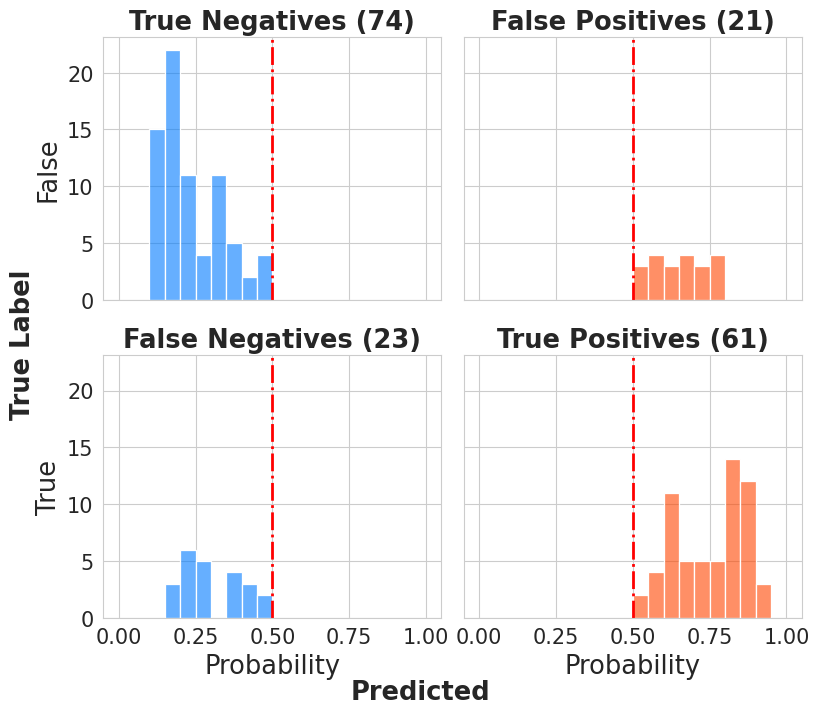

In [41]:
visualize_model_predictions(model, data_module)

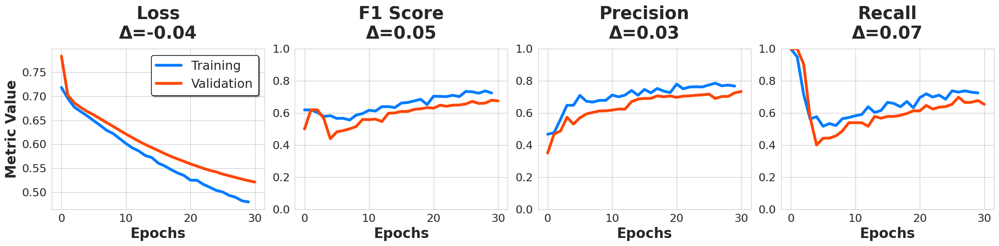

In [14]:
# Usage example, toggle titles and x-axis labels
plot_metrics_curves(model)

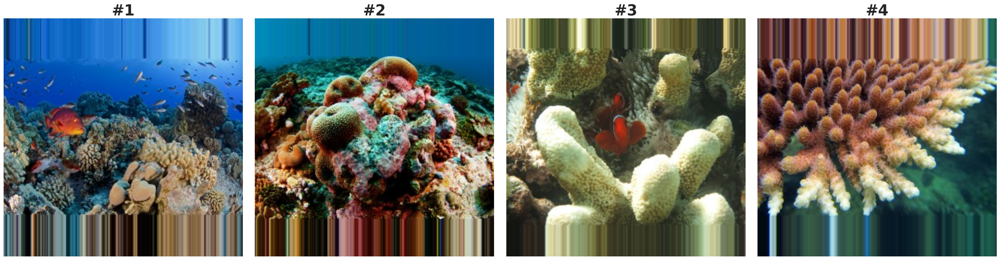

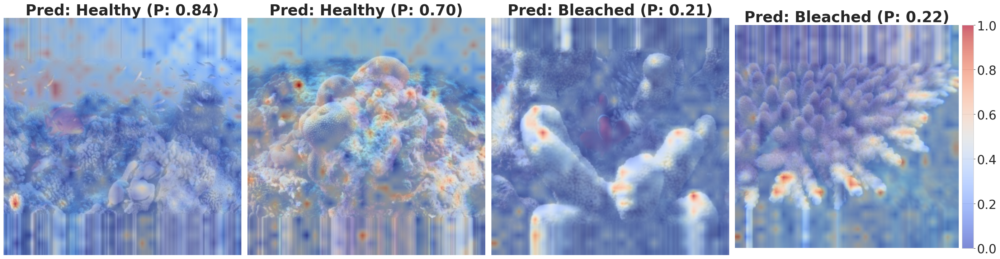

In [20]:
# Example usage with four images
image_paths = [
    'coral_original/healthy_corals/10472474274_1f73391912_o.jpg',
    'coral_original/healthy_corals/12618485353_670ca1b648_o.jpg',
    'coral_original/bleached_corals/25382194631_baca94f8a8_o.jpg',
    'attention_map_pics/attentionmap_example.jpg'
]

# Preprocess all four images
processed_images = [preprocess_single_image(image_path, img_size=300, padding_mode='edge') for image_path in image_paths]

# Plot the original images
plot_original_images(processed_images)
# Visualize the attention maps
visualize_average_attention_maps(model, processed_images)

### **`2) Convolution`**
#### a) Default:

In [23]:
# Paths to your dataset
data_dir = 'coral_original'

# Example usage
data_module = CoralDataModule(
        data_dir=data_dir, 
        batch_size=12,    
        img_size=300, 
        scaler_type='min-max', 
        test_size=0.2, 
        val_size=0.2, 
        num_workers=2,
        padding_mode='edge'           
)

# Call the setup method if it's not automatically called within a trainer
data_module.setup()

# Create the train dataloader and measure its length
train_loader = data_module.train_dataloader()
num_batches = len(train_loader)
print("Number of training batches:", num_batches)

# Determine an appropriate log interval
# Here, I'm setting it to log at least once per epoch or more frequently if desired
log_every_n_steps = max(1, num_batches // 10)

# Initialize the Vision Transformer Model
model = ViT(
    img_size=300,
    patch_size=16,      #16
    in_channels=3,
    embed_size=66,      #64    #66 worked well aslo
    depth=2,            #2       
    heads=3,            #2     # 3 wokred well also
    mlp_dim=128,        #128
    dropout=0.2,        #2
    learning_rate=1e-4, #1e-4              
    embedding_type='conv',
)



# Set up the trainer
trainer = pl.Trainer(
    max_epochs=30,       # before 30
    precision="16-mixed",
    devices=1 if torch.cuda.is_available() else 1,
    accelerator='gpu' if torch.cuda.is_available() else 'cpu',
    log_every_n_steps=log_every_n_steps
)

# Train the model
trainer.fit(model, datamodule=data_module)

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name               | Type              | Params | Mode 
------------------------------------------------------------------
0  | patch_embedding    | PatchEmbedding    | 72.3 K | train
1  | transformer_blocks | Sequential        | 70.1 K | train
2  | to_cls_token       | Identity          | 0      | train
3  | mlp_head           | Sequential        | 199    | train
4  | train_accuracy     | BinaryAccuracy    | 0      | train
5  | val_accuracy       | BinaryAccuracy    | 0      | train
6  | test_accuracy      | BinaryAccuracy    | 0      | train
7  | train_f1           | BinaryF1Score     | 0      | train
8  | val_f1             | BinaryF1Score     | 0      | train
9  | test_f1            | BinaryF1Score     | 0      | train
10 | train_precision    | BinaryPrecision   | 0      | trai

Number of training batches: 45


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=30` reached.


In [24]:
trainer.test(model,datamodule=data_module)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7653631567955017
         test_f1            0.7156631350517273
        test_loss           0.5153282880783081
     test_precision         0.7574355602264404
       test_recall          0.6936686038970947
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.5153282880783081,
  'test_acc': 0.7653631567955017,
  'test_f1': 0.7156631350517273,
  'test_precision': 0.7574355602264404,
  'test_recall': 0.6936686038970947}]

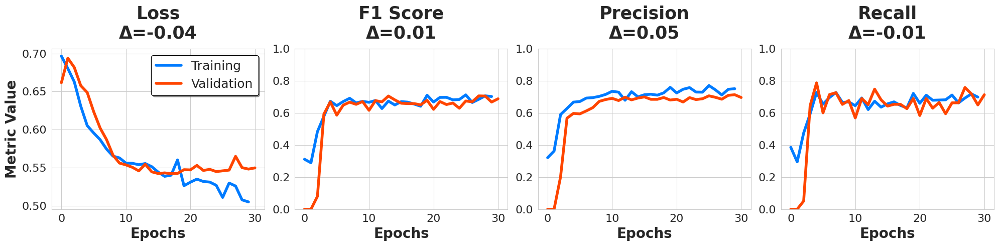

In [18]:
plot_metrics_curves(model)

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

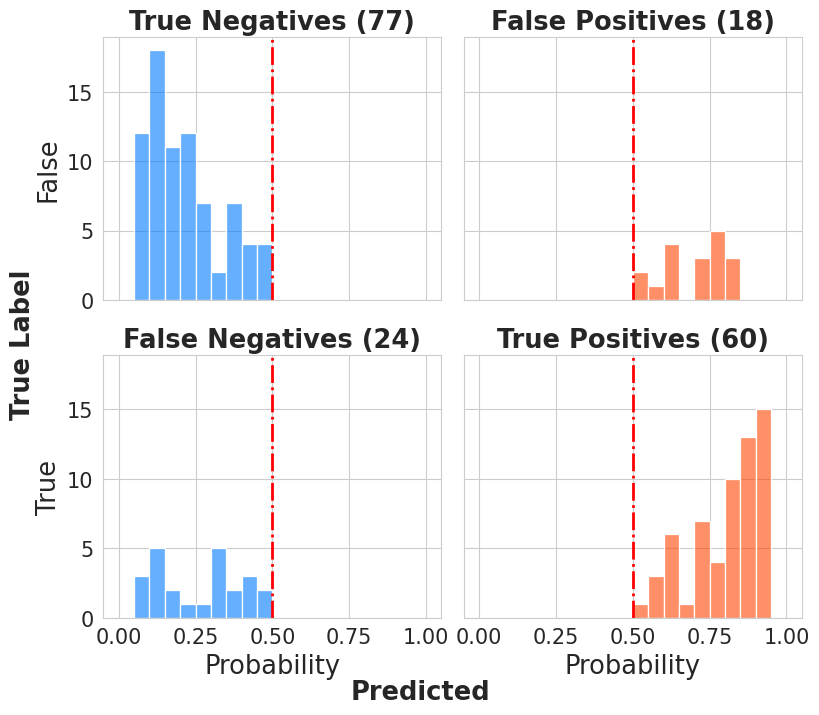

In [25]:
visualize_model_predictions(model, data_module)

`Attention Maps`

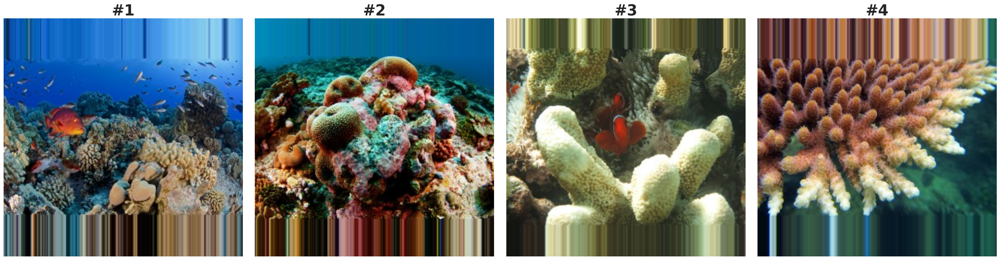

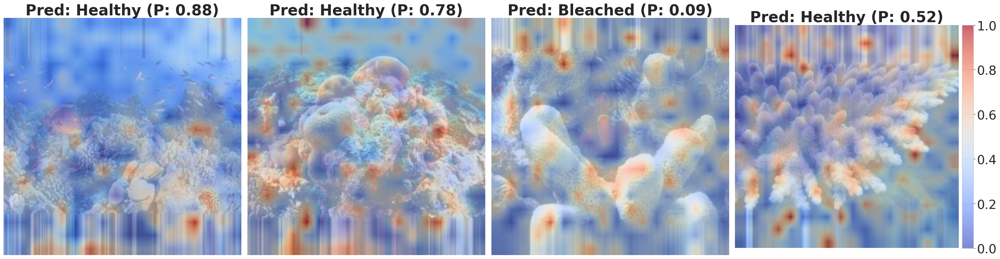

In [26]:


# Example usage with four images
image_paths = [
    'coral_original/healthy_corals/10472474274_1f73391912_o.jpg',
    'coral_original/healthy_corals/12618485353_670ca1b648_o.jpg',
    'coral_original/bleached_corals/25382194631_baca94f8a8_o.jpg',
    'attention_map_pics/attentionmap_example.jpg'
]

# Preprocess all four images
processed_images = [preprocess_single_image(image_path, img_size=300, padding_mode='edge') for image_path in image_paths]

# Plot the original images
plot_original_images(processed_images)
# Visualize the attention maps
visualize_average_attention_maps(model, processed_images)

#### b) Tuning:

In [7]:
!pip install optuna-integration

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.4/93.4 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 21.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.0/233.0 kB 43.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 17.4 MB/s eta 0:00:00


In [32]:
import optuna
import torch
import torch.nn as nn
import pytorch_lightning as pl
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint
from optuna.integration import PyTorchLightningPruningCallback
from torch.utils.data import DataLoader
from optuna.trial import TrialState
from torchmetrics.classification import F1Score



def objective(trial, embedding_type):
    # Suggest hyperparameters
    patch_size = trial.suggest_int('patch_size', 4, 32, step=4)
    depth      = trial.suggest_int('depth', 1, 6)
    mlp_dim    = trial.suggest_categorical('mlp_dim', [64, 128, 256])
    dropout    = trial.suggest_float('dropout', 0.0, 0.5)
    # Suggest an embed_size that is a multiple of 32 to ensure it's divisible by heads
    embed_size = trial.suggest_int('embed_size', 32, 256, step=32)
    
    # Calculate valid head options
    valid_heads = [h for h in range(2, min(embed_size // 32, 8) + 1) if embed_size % h == 0]
    # If there are no valid head options, return a poor score
    if not valid_heads:
        return float('-inf')
    # Else suggest heads from valid options
    heads = trial.suggest_categorical('heads', valid_heads)
    
    # Set fourier-specific parameters if using fourier embedding
    fourier_params = None
    if embedding_type == 'fourier':
        fourier_params = {
            'gridsize':              trial.suggest_int('gridsize', 4, 64),
            'addbias':               trial.suggest_categorical('addbias', [True, False]),
            'smooth_initialization': trial.suggest_categorical('smooth_initialization', [True, False])
        }
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True)

    # Initialize the model and avoid trial crashes
    try:
        model = ViT(
            img_size=300,
            patch_size=patch_size,
            in_channels=3,
            embed_size=embed_size,
            depth=depth,
            heads=heads,
            mlp_dim=mlp_dim,
            dropout=dropout,
            embedding_type=embedding_type,
            fourier_params=fourier_params,
            learning_rate = learning_rate
        )
    except AssertionError as e:
        print(f"Trial failed due to: {e}")
        return float('-inf')  # Use neg infinity to penalize the trial


    # Initialize the data module (make sure this is defined)
    data_module = CoralDataModule(
        data_dir   = 'coral_original',
        batch_size = trial.suggest_int('batch_size', 8, 32, step=4),
        img_size   = 300
    )
    data_module.setup()

    # Initialize trainer with Optuna pruning
    trainer = pl.Trainer(
        max_epochs=50,
        precision="16-mixed",
        devices=1 if torch.cuda.is_available() else 1,
        accelerator='gpu' if torch.cuda.is_available() else 'cpu',
        log_every_n_steps=1,  # Log every step
        enable_progress_bar=True,  # Enable progress bar
    )

    # Train the model
    trainer.fit(model, datamodule=data_module)
    ###########################################
    # del model to get rif of cuda error?
    ###########################################
    

    # Get the training and validation F1-Scores
    train_f1 = trainer.callback_metrics.get('train_f1').item()
    val_f1 = trainer.callback_metrics.get('val_f1').item()

    # Ensure the performance gap is not greater than 5%
    performance_gap = abs(train_f1 - val_f1)
    if performance_gap > 0.05:
        return 0.0  # Penalize trials with large train-validation performance gap

    return val_f1  # Return the validation F1-Score as the objective

In [33]:
study = optuna.create_study(
    direction='maximize',
    pruner=optuna.pruners.MedianPruner()
)
study.optimize(lambda trial: objective(trial, 'conv'), n_trials=28, show_progress_bar=True, catch=(ValueError,))

[I 2024-08-25 14:48:38,032] A new study created in memory with name: no-name-a83f9ac0-a595-491b-9f24-9d4ab021ba4b


  0%|          | 0/28 [00:00<?, ?it/s]

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name               | Type              | Params | Mode 
------------------------------------------------------------------
0  | patch_embedding    | PatchEmbedding    | 1.3 M  | train
1  | transformer_blocks | Sequential        | 1.3 M  | train
2  | to_cls_token       | Identity          | 0      | train
3  | mlp_head           | Sequential        | 673    | train
4  | train_accuracy     | BinaryAccuracy    | 0      | train
5  | val_accuracy       | BinaryAccuracy    | 0      | train
6  | test_accuracy      | BinaryAccuracy    | 0      | train
7  | train_f1           | BinaryF1Score     | 0      | train
8  | val_f1             | BinaryF1Score     | 0      | train
9  | test_f1            | BinaryF1Score     | 0      | train
10 | train_precision    | BinaryPrecision   | 0      | trai

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

[W 2024-08-25 14:48:39,739] Trial 0 failed with parameters: {'patch_size': 4, 'depth': 4, 'mlp_dim': 256, 'dropout': 0.4387727254182773, 'embed_size': 224, 'heads': 4, 'learning_rate': 9.777956730912229e-05, 'batch_size': 20} because of the following error: OutOfMemoryError('CUDA out of memory. Tried to allocate 9.43 GiB. GPU 0 has a total capacty of 15.89 GiB of which 404.69 MiB is free. Process 1959027 has 15.49 GiB memory in use. Of the allocated memory 5.22 GiB is allocated by PyTorch, and 9.31 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF').
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/optuna/study/_optimize.py", line 196, in _run_trial
    value_or_values = func(trial)
                      ^^^^^^^^^^^
  File "/tmp/ipykernel_64/1485598828.py", line 5, in <lambda>
    study.optimiz

OutOfMemoryError: CUDA out of memory. Tried to allocate 9.43 GiB. GPU 0 has a total capacty of 15.89 GiB of which 404.69 MiB is free. Process 1959027 has 15.49 GiB memory in use. Of the allocated memory 5.22 GiB is allocated by PyTorch, and 9.31 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

### **`3) MLP`**

In [19]:
# Paths to your dataset
data_dir = 'coral_original'

# Example usage
data_module = CoralDataModule(
        data_dir=data_dir, 
        batch_size=12,    
        img_size=300, 
        scaler_type='min-max', 
        test_size=0.2, 
        val_size=0.2, 
        num_workers=2,
        padding_mode='edge'           
)

# Call the setup method if it's not automatically called within a trainer
data_module.setup()

# Create the train dataloader and measure its length
train_loader = data_module.train_dataloader()
num_batches = len(train_loader)
print("Number of training batches:", num_batches)

# Determine an appropriate log interval
# Here, I'm setting it to log at least once per epoch or more frequently if desired
log_every_n_steps = max(1, num_batches // 10)

# Initialize the Vision Transformer Model
model = ViT(
    img_size=300,
    patch_size=10, #10  
    in_channels=3,
    embed_size=64,   
    depth=2,        # 2
    heads=2,        #2
    mlp_dim=128,    #128
    dropout=0.1,
    learning_rate=1e-4,       #1e-4             
    embedding_type='linear',
)



# Set up the trainer
trainer = pl.Trainer(
    max_epochs=30,       # before 30
    precision="16-mixed",
    devices=1 if torch.cuda.is_available() else 1,
    accelerator='gpu' if torch.cuda.is_available() else 'cpu',
    log_every_n_steps=log_every_n_steps
)

# Train the model
trainer.fit(model, datamodule=data_module)

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Number of training batches: 45



   | Name               | Type              | Params | Mode 
------------------------------------------------------------------
0  | patch_embedding    | PatchEmbedding    | 77.0 K | train
1  | transformer_blocks | Sequential        | 66.9 K | train
2  | to_cls_token       | Identity          | 0      | train
3  | mlp_head           | Sequential        | 193    | train
4  | train_accuracy     | BinaryAccuracy    | 0      | train
5  | val_accuracy       | BinaryAccuracy    | 0      | train
6  | test_accuracy      | BinaryAccuracy    | 0      | train
7  | train_f1           | BinaryF1Score     | 0      | train
8  | val_f1             | BinaryF1Score     | 0      | train
9  | test_f1            | BinaryF1Score     | 0      | train
10 | train_precision    | BinaryPrecision   | 0      | train
11 | val_precision      | BinaryPrecision   | 0      | train
12 | test_precision     | BinaryPrecision   | 0      | train
13 | train_recall       | BinaryRecall      | 0      | train
14 | val_recall  

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=30` reached.


In [22]:
trainer.test(model, datamodule=data_module)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc             0.74301677942276
         test_f1            0.6951106786727905
        test_loss            0.530056893825531
     test_precision          0.72801274061203
       test_recall          0.6951583623886108
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.530056893825531,
  'test_acc': 0.74301677942276,
  'test_f1': 0.6951106786727905,
  'test_precision': 0.72801274061203,
  'test_recall': 0.6951583623886108}]

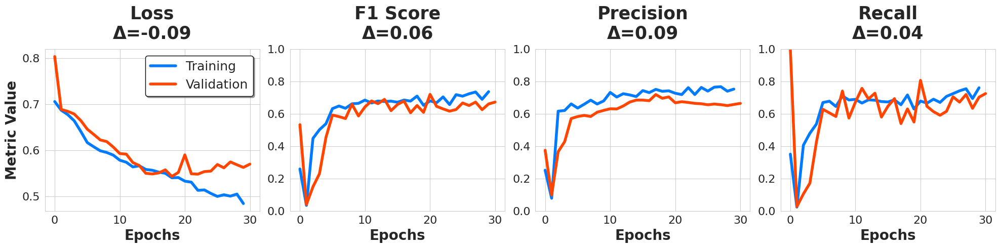

In [26]:
# Example usage
plot_metrics_curves(model)

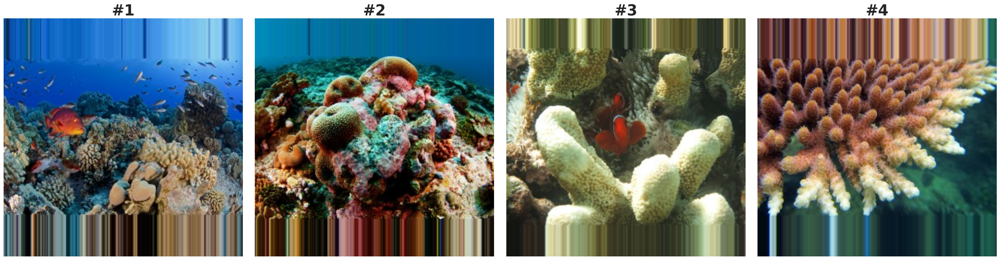

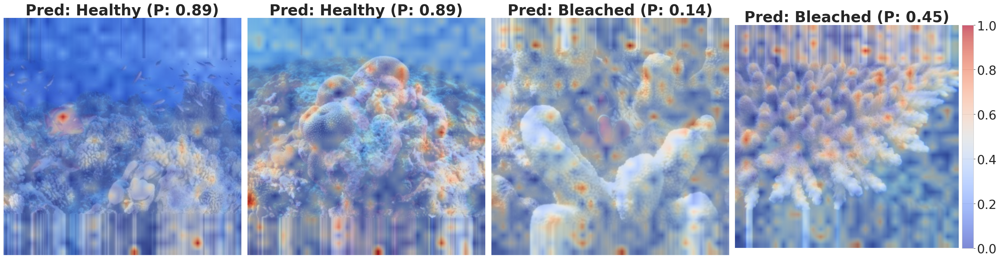

In [29]:
# Example usage with four images
image_paths = [
    'coral_original/healthy_corals/10472474274_1f73391912_o.jpg',
    'coral_original/healthy_corals/12618485353_670ca1b648_o.jpg',
    'coral_original/bleached_corals/25382194631_baca94f8a8_o.jpg',
    'attention_map_pics/attentionmap_example.jpg'
]

# Preprocess all four images
processed_images = [preprocess_single_image(image_path, img_size=300, padding_mode='edge') for image_path in image_paths]

# Plot the original images
plot_original_images(processed_images)
# Visualize the attention maps
visualize_average_attention_maps(model, processed_images)

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

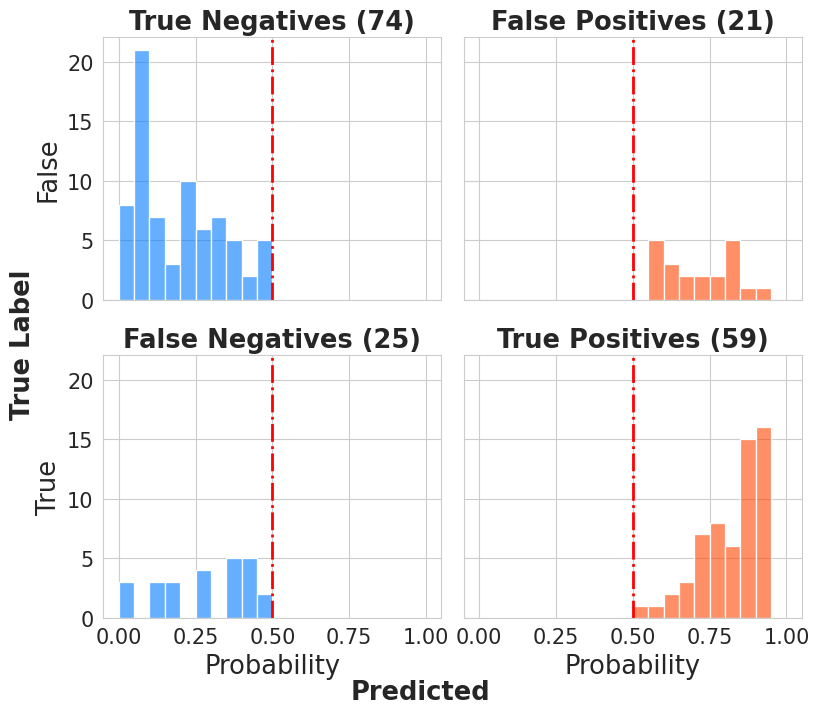

In [21]:
visualize_model_predictions(model, data_module)

### ***`Final Test Set Evaluation of all Models`***
---

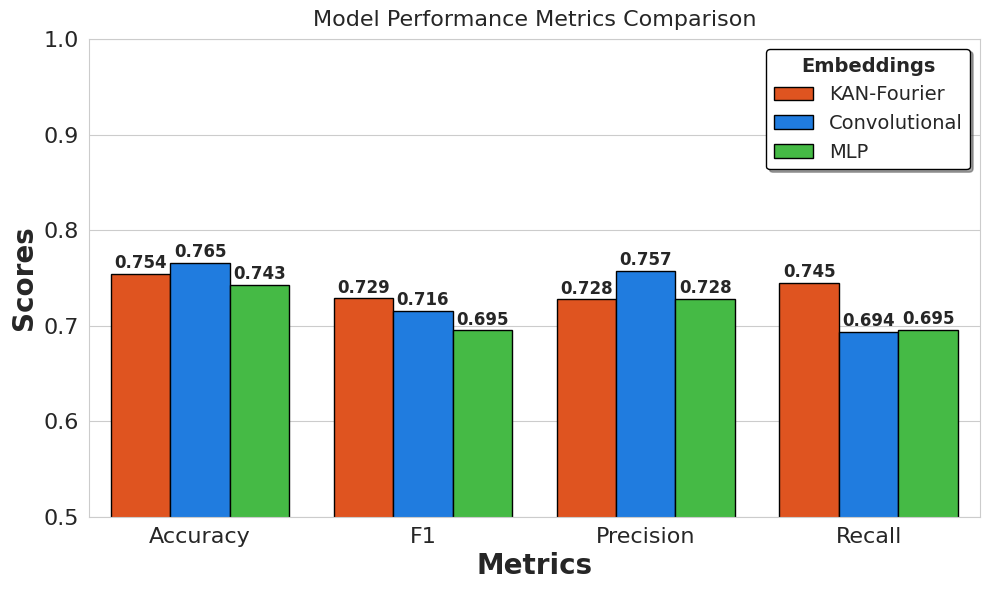

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid")
import pandas as pd
import numpy as np


# Data for the metrics
metrics = ['Accuracy', 'F1', 'Precision', 'Recall']
kan_fourier = [0.7541899681091309, 0.7285431623458862, 0.7275871634483337, 0.7447458505630493]
convolutional = [0.7653631567955017, 0.7156631350517273, 0.7574355602264404, 0.6936686038970947]
mlp = [0.74301677942276, 0.6951106786727905, 0.72801274061203, 0.6951583623886108]

# Prepare the data for seaborn
data = {
    'Model': ['KAN-Fourier'] * len(metrics) + ['Convolutional'] * len(metrics) + ['MLP'] * len(metrics),
    'Metrics': metrics * 3,
    'Scores': kan_fourier + convolutional + mlp
}

# Convert to seaborn-friendly format
import pandas as pd
df = pd.DataFrame(data)


blue = "#007BFF"
red = "#FF4500"
# Using seaborn to create the bar plot with manually set colors for each model
plt.figure(figsize=(10, 6))

# Define custom colors for each model
custom_palette = {
    'KAN-Fourier': "#FF4500",   # Blue
    'Convolutional': "#007BFF", # Orange
    'MLP': 'limegreen'            # Green
}

# Create a seaborn barplot with custom colors
sns.barplot(data=df, x='Metrics', y='Scores', hue='Model', palette=custom_palette, edgecolor='black')

# Add titles and labels
plt.xlabel('Metrics', fontsize=20, weight='bold')
plt.ylabel('Scores', fontsize=20, weight='bold')
plt.title('Model Performance Metrics Comparison', fontsize=16, y=1.01)
plt.ylim(0.5, 1) #0.7 - 0.8
legend = plt.legend(shadow=True, edgecolor='black', fontsize=14, title='Embeddings', title_fontsize=14)
legend.get_title().set_fontweight('bold')
plt.xticks(fontsize=16)  # Increase x-tick labels size
plt.yticks(fontsize=16)  # Increase y-tick labels size

# Annotate bars with values
for p in plt.gca().patches:
    plt.text(p.get_x() + p.get_width() / 2., p.get_height() + 0.002, f'{p.get_height():.3f}', ha='center', va='bottom', fontsize=12, weight='bold')

# Display the plot
plt.tight_layout()
plt.show();

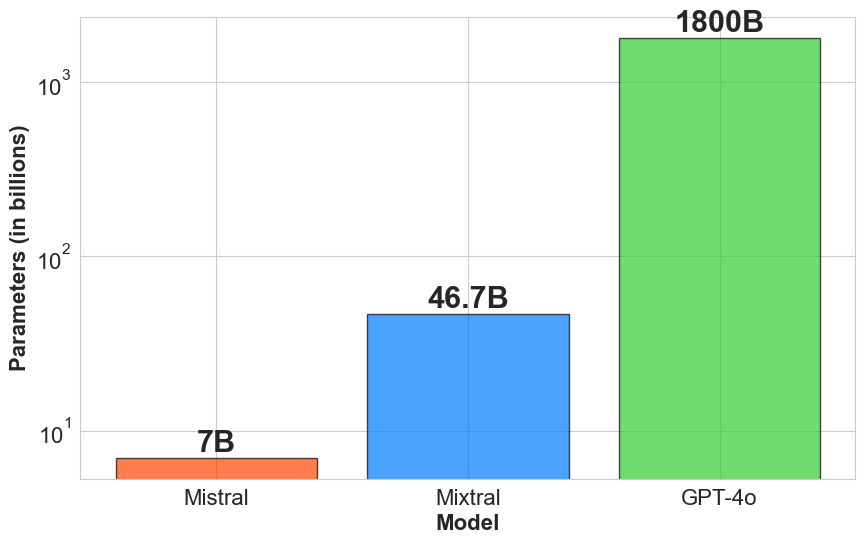

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid")

# Data for parameter counts
models = ["Mistral", "Mixtral", "GPT-4o"]
parameters_in_billions = [7, 46.7, 1800]  # Parameter counts in billions

# Create bar chart
plt.figure(figsize=(10, 6))
bars = plt.bar(models, parameters_in_billions, color=['#FF4500', '#007BFF', 'limegreen'], edgecolor='black', alpha=0.7)

# Add labels on top of the bars
for bar, value in zip(bars, parameters_in_billions):
    plt.text(
        bar.get_x() + bar.get_width() / 2, bar.get_height(), f'{value}B', ha='center', va='bottom', fontsize=22, weight='bold'
    )

plt.xlabel("Model", fontsize=16, weight='bold')

# Increase font size for y-axis tick labels
plt.xticks(fontsize=16, rotation=0)
plt.yticks(fontsize=16)


plt.ylabel("Parameters (in billions)", fontsize=16, weight='bold')
#plt.title("Comparison of Model Parameters", fontsize=16, weight='bold')
plt.yscale('log')  # Logarithmic scale due to large range in values
plt.show()